# Notebook 03 (V4_3) — $\nu_b=\xi_W=0$ AHP Pattern: Source $T=110$, Certified $T=78$

This replicates `Two_country_proudction_fixed_nu_b/03_v9_ahp_pattern_T110_replication_fixed_nu_b.ipynb`
at zero exponents and keeps the AHP-matching
`pathwise_hi_exp_pi075` calibration unchanged in every other primitive. The
source request remains explicit at $T=110$, while the fresh zero-exponent
continuation has a hard-valid, certified path through $T=78$. The absorbing
system contains seven equilibrium unknowns only. Common growth is the
identity $G_{N,US}^{0}=G_{N,W}^{0}=1$, so no exponent is solved and no
common-growth residual or root dimension exists.

All model code, continuation scripts, sweeps, figures, and exports are local to
`Two_country_proudction_zero_nu_b`. Source common-growth CSV artifacts are read
only as comparison benchmarks.


## Resolved continuation frontier

The workflow retains Notebook 17's long-horizon continuation strategy for the
all-$u$ branch. For each parameterization it solves one normalized absorbing
equilibrium, then algebraically constructs every switch successor with constant
policies/aggregates and $q_i,d_i\propto1/N_i$. The continuation therefore has
no state-by-state absorbing root loop. This simplification does not by itself
guarantee that the all-$u$ branch remains numerically and economically regular
to the source-requested horizon.

The certified frontier is $T=78$. The first extension beyond it, $T=79$, is
non-interior; the later $T=81$ extension is also residual-unsafe. These are
reported as frontier evidence, so the notebook does not relabel the source
request $T=110$ as a solved or certified zero-exponent path. The failed-horizon
audit is expensive and therefore opt-in via
`NB03_ZERO_NU_B_RUN_FRONTIER_AUDIT=true`; the output CSV labels whether those
probes were freshly rerun or taken from the prior sequential audit.

The AHP accounting uses the direct identity `NFA = A - Q_US`. Equality to the
source AHP path is a diagnostic, not a validity gate.


In [1]:
function nb03_notebook_project_dir(start_dir=pwd())
    dir = abspath(start_dir)
    while true
        for candidate in (dir, joinpath(dir, "Codes"))
            script = joinpath(candidate, "Two_country_proudction_zero_nu_b",
                              "03_v9_ahp_pattern_T110_replication_zero_nu_b.jl")
            isfile(script) && return candidate
        end
        parent = dirname(dir)
        parent == dir && error("Could not locate the zero-nu_b Notebook 03 script")
        dir = parent
    end
end

nb03_project_dir = nb03_notebook_project_dir()
include(joinpath(nb03_project_dir, "Two_country_proudction_zero_nu_b",
                 "03_v9_ahp_pattern_T110_replication_zero_nu_b.jl"))


  Activating 

Project directory:             /Users/jipengcheng/Library/Mobile Documents/com~apple~CloudDocs/【Research】/Two_country_HKT/Codes

project at `~/Library/Mobile Documents/com~apple~CloudDocs/【Research】/Two_country_HKT/Codes`



Output directory:              /Users/jipengcheng/Library/Mobile Documents/com~apple~CloudDocs/【Research】/Two_country_HKT/Codes/Two_country_proudction_zero_nu_b/outputs_zero_nu_b/03_ahp_pattern_source_T110_resolved_T78
Certified zero-case horizon:   78
Scratch buffer:                0
Zero nu_b = xi_W:             0.0
Common-growth equation:        absent (1 = 1 identity)
Source requested horizon:       110
Frontier probes:                [79, 80, 81]
Run expensive frontier audit:  false
Source calibration benchmark:  /Users/jipengcheng/Library/Mobile Documents/com~apple~CloudDocs/【Research】/Two_country_HKT/Codes/Two_country_production_common_growth/outputs_v43/ahp_pattern_first_window_common_growth_search
Warm-continuation horizons:    [30, 45, 60, 70, 75, 76, 77, 78]
Branch-iteration schedule:     [60, 200, 500]
Solving T=30, buffer=0, branch_iters=60, warm_T=
Solving T=45, buffer=0, branch_iters=60, warm_T=30
Solving T=60, buffer=0, branch_iters=60, warm_T=45
Solving T=70, buffer=0

## Zero-nu_b Notebook 15 figure comparison on the certified $T=78$ solution

The original styling is retained: the first-window series are opaque and the post-15 tail is muted.

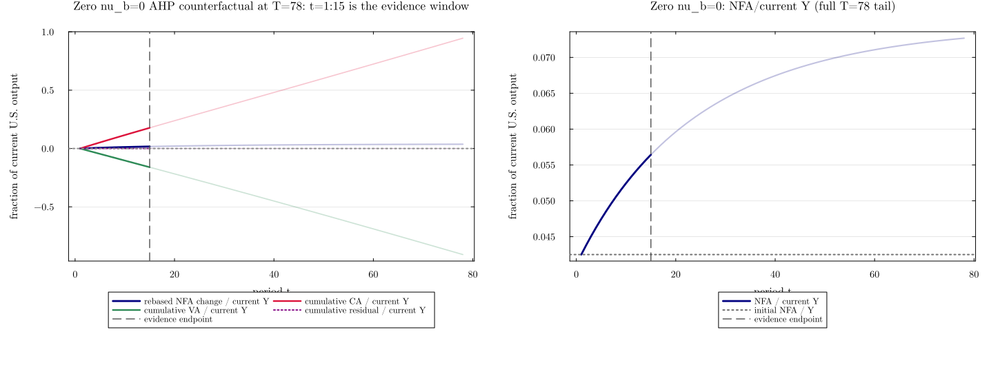

In [2]:
fig_ahp_two_panel

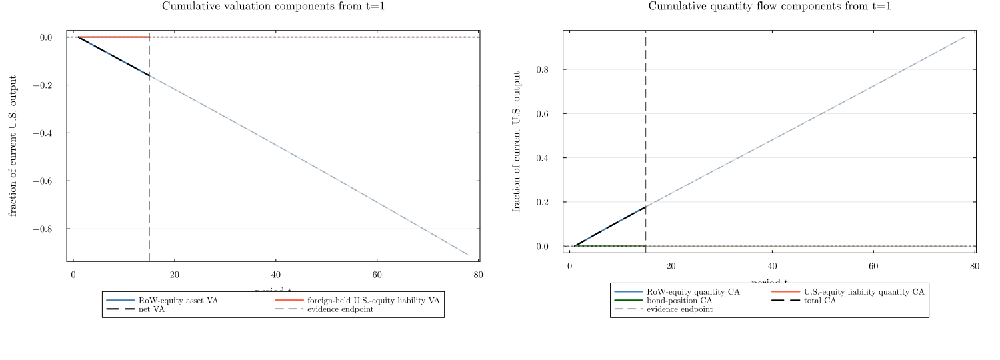

In [3]:
fig_subcomponents

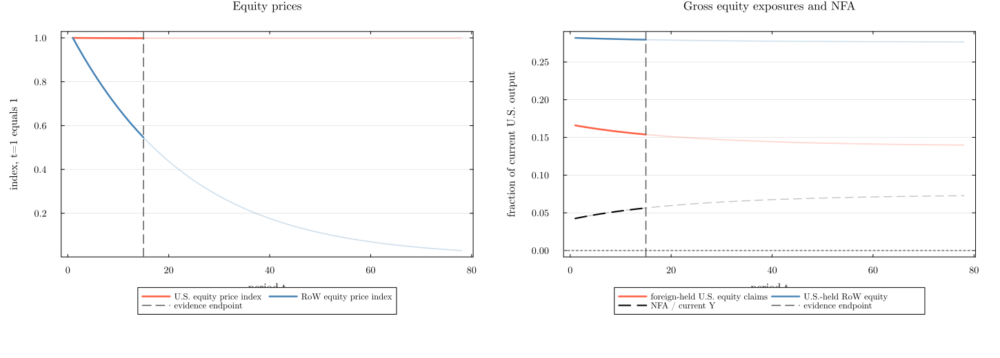

In [4]:
fig_prices_exposures

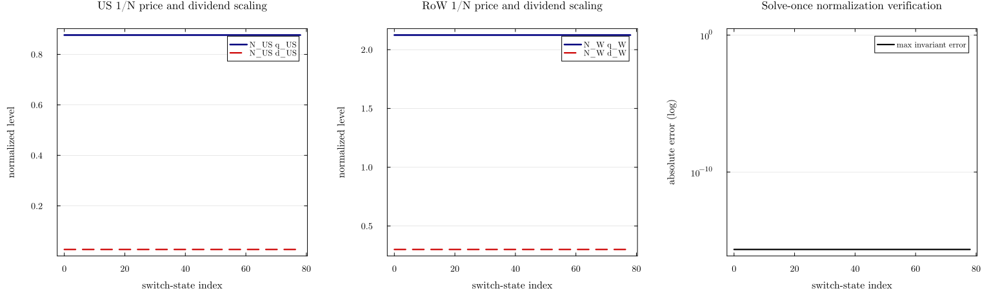

In [5]:
fig_absorbing_normalization

## Certification Summary

The hard gate covers equilibrium residuals, feasibility/interiority, exact NFA
accounting, primitive ordering $0=\nu_b<\nu_u<\xi_u$, convergence of every
algebraically restated absorbing record, and the solve-once normalization
invariants. Common growth is not a gate or equation; it is automatically $1=1$.
The source request is $T=110$, the resolved/certified path ends at $T=78$,
and the frontier evidence is recorded separately at non-interior $T=79$ and
residual-unsafe $T=81$, with explicit fresh-versus-prior-audit provenance.


In [6]:
@printf("Source requested horizon:         %d\n", SOURCE_REQUESTED_T)
@printf("Resolved/certified horizon:       %d\n", T_solved)
println("Frontier evidence:                 T=79 first non-interior; T=81 residual-unsafe")
@printf("Model hard-valid solution:        %s\n", best_validity.valid)
@printf("Zero nu_b / xi_W:                %.1f / %.1f\n",
        best_result.params.ν_b, best_result.params.ξ_W)
@printf("Maximum u residual:               %.3e\n", best_result.max_u_residual)
@printf("Maximum BGP residual:             %.3e\n", best_result.max_bgp_residual)
@printf("First-window gap vs CG source:    %.3e\n", nb19_max_first_window_error)
println("Matches source path tolerance:     ", nb19_first_window_matches_source)
@printf("t=15 rebased NFA / current Y:     %+.6f\n", best_metrics.target_rebased_nfa)
@printf("t=15 net VA / cumulative CA:      %+.6f / %+.6f\n",
        best_metrics.target_net_va, best_metrics.target_ca)
@printf("Maximum absorbing-normalization error: %.3e\n",
        maximum((best_absorbing_summary.policy_invariance_error,
                 best_absorbing_summary.aggregate_invariance_error,
                 best_absorbing_summary.per_variety_scaling_error,
                 best_absorbing_summary.automatic_growth_identity_error)))
println("Artifacts:                         ", NB19_OUTDIR)


Source requested horizon:         110
Resolved/certified horizon:       78
Frontier evidence:                 T=79 first non-interior; T=81 residual-unsafe
Model hard-valid solution:        true
Zero nu_b / xi_W:                0.0 / 0.0
Maximum u residual:               2.903e-08
Maximum BGP residual:             6.062e-11
First-window gap vs CG source:    1.666e-01
Matches source path tolerance:     false
t=15 rebased NFA / current Y:     +0.016904
t=15 net VA / cumulative CA:      -0.160366 / +0.177271
Maximum absorbing-normalization error: 1.110e-16
Artifacts:                         /Users/jipengcheng/Library/Mobile Documents/com~apple~CloudDocs/【Research】/Two_country_HKT/Codes/Two_country_proudction_zero_nu_b/outputs_zero_nu_b/03_ahp_pattern_source_T110_resolved_T78


## Parameter Sweeps for Zero-$\nu_b$ Bubble Bounds and Leakage Contributions

This section applies the source $\pi$ and $\gamma$ sweep grids to the zero-$\nu_b$ AHP calibration. All unswept primitives remain at their AHP values, with $\nu_b=0=\xi_W$ and no common-growth restriction. The support-script filename preserves the source request `T105`, but the zero-case sweep is resolved at `T_max = 78`, with `n_buffer = 0`.

For every parameter value, the equilibrium is extended by warm continuation through `30, 45, 60, 70, 75, 76, 77, 78`. The AHP baseline is solved first and supplies a state-matched parameter-continuation seed at the initial horizon; all later horizons use the preceding solution under the target parameterization. Thus a generic cold-start basin failure is not misclassified as nonexistence. The replication uses a declared 60-sweep budget per stage; a case that remains unsafe at that budget is exported as numerically unavailable rather than extrapolated. Set `NB03_ZERO_NU_B_SWEEP_BRANCH_ITER_SCHEDULE=60,200,500,1000` for the exhaustive retry schedule. The theoretical bubble-share interval uses cutoff $K=76$ and checks its finite prefix against the separate `T=77` solution. The five displayed objects are the theoretical upper bound, theoretical lower bound, $a_t$, $d_t^u/q_t^u$, and weighted switch contribution $(1-\pi)L_t/\pi$.

The displayed figures are exported as `sweep_pi_five_quantities_T78.png`,
`sweep_gamma_five_quantities_T78.png`, `sweep_pi_nfa_12_panels_T78.png`,
and `sweep_gamma_nfa_12_panels_T78.png`.


In [7]:
include(joinpath(nb03_project_dir, "Two_country_proudction_zero_nu_b",
                 "03_v9_ahp_pattern_T110_sweeps_T105_zero_nu_b.jl"))



Two-country zero-nu-b AHP-calibration parameter sweeps
Zero nu_b = xi_W:             0.0
Common-growth restriction:     disabled
Source-requested horizon:       105
Resolved sweep horizon T_max:   78
Reference horizon:              77
Bound cutoff K:                 76
Endpoint guard:                 2
Branch-iteration retry budget:  [60]
Sweep mode:                      full
π grid:                         [0.7, 0.75, 0.8, 0.9, 0.95, 0.97, 0.99, 0.995]
γ grid:                         [0.05, 0.25, 0.5, 0.75, 0.9]
baseline     pi = 0.75, gamma = 0.25 (AHP seed) T= 30 iter= 60 warm=
baseline     pi = 0.75, gamma = 0.25 (AHP seed) T= 45 iter= 60 warm=30
baseline     pi = 0.75, gamma = 0.25 (AHP seed) T= 60 iter= 60 warm=45
baseline     pi = 0.75, gamma = 0.25 (AHP seed) T= 70 iter= 60 warm=60
baseline     pi = 0.75, gamma = 0.25 (AHP seed) T= 75 iter= 60 warm=70
baseline     pi = 0.75, gamma = 0.25 (AHP seed) T= 76 iter= 60 warm=75
baseline     pi = 0.75, gamma = 0.25 (AHP seed) T= 77 it

### Sweep over persistence $\pi$

The single-country grid is retained, and $\pi=0.75$ is added and marked as the zero-nu_b AHP baseline.

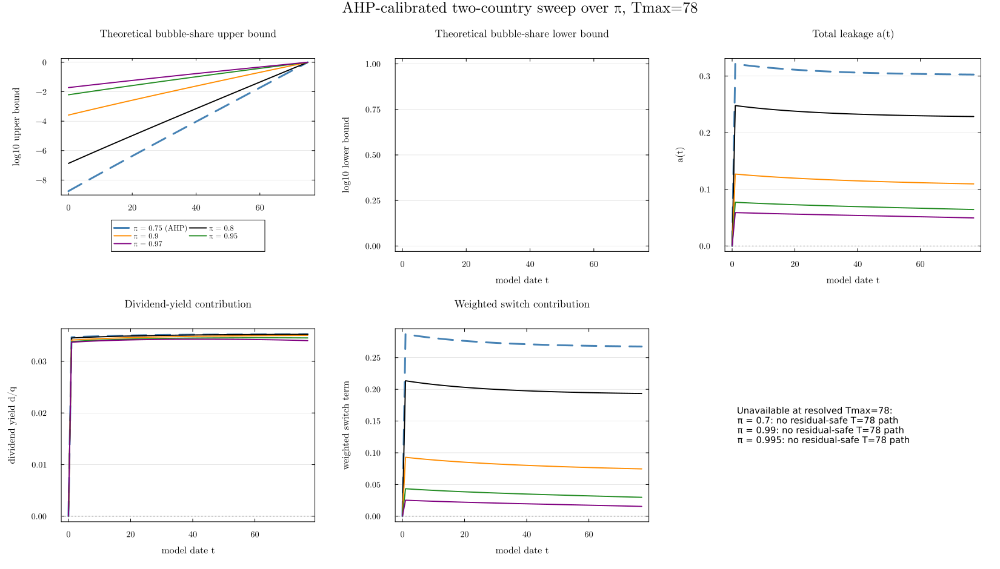

In [8]:
pi_sweep_five_quantity_fig

### Sweep over risk aversion $\gamma$

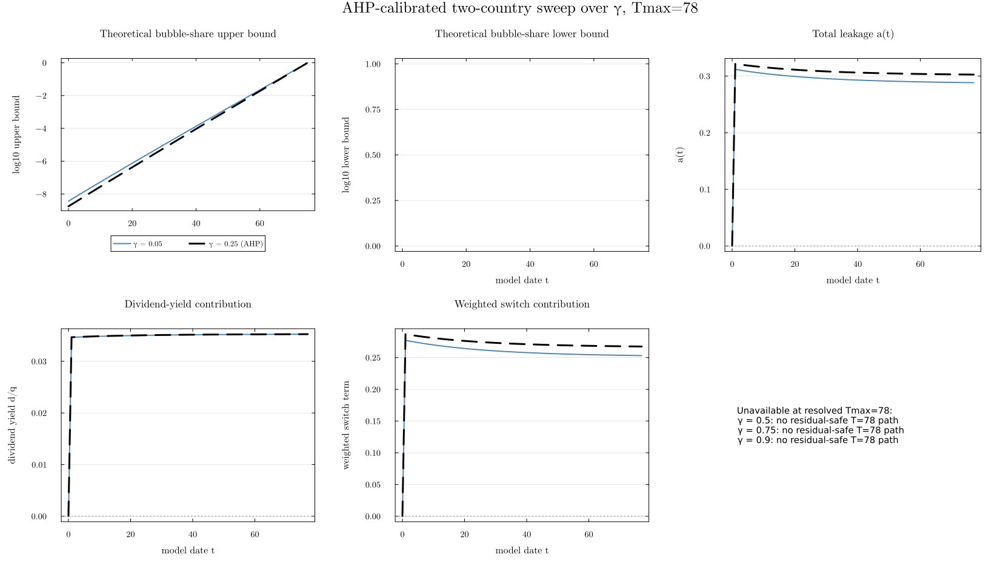

In [9]:
gamma_sweep_five_quantity_fig

### U.S. NFA decomposition over persistence $\pi$

The following 12-panel figure uses the same hard-valid resolved $T_{\max}=78$ persistence cases as the five-quantity bubble-bound figure. The source request remains $T_{\max}=105$. U.S. NFA is rebased at the initial model date; NFA, valuation, current-account, and gross-position series are divided by current U.S. output, while equity prices are indexed to one initially. The duplicated `RoW-equity asset VA` in the request is interpreted as `U.S.-equity liability VA`.

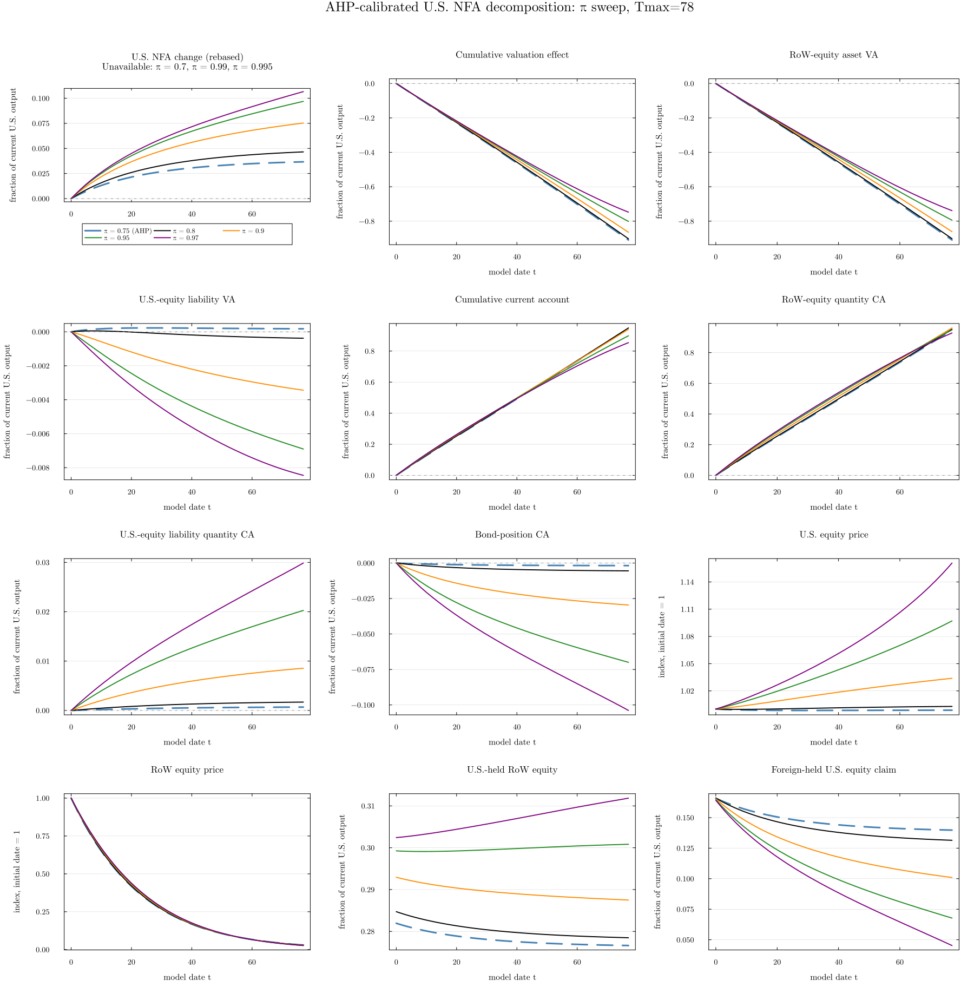

In [10]:
pi_sweep_nfa_figure

### U.S. NFA decomposition over risk aversion $\gamma$

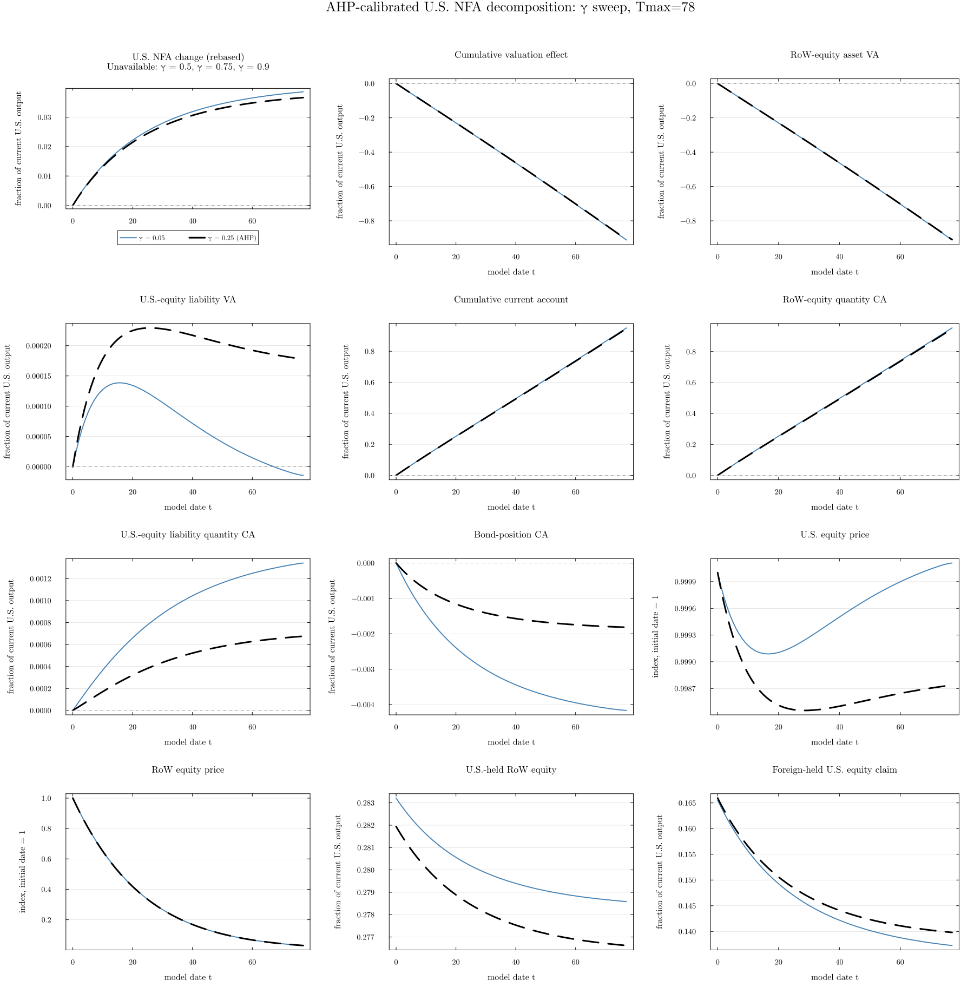

In [11]:
gamma_sweep_nfa_figure

### Econometric and Theoretical Qualification

These are comparative-static exercises around the zero-$\nu_b$ version of the AHP calibration, not fresh AHP calibrations at every grid point. The source-requested `T_max=105` exercise is resolved at `T_max=78`; a plotted lower bound remains conditional on the finite-tail envelope diagnostics and on extending the stated uniform premises beyond that solved horizon. The CSV summary reports the independent HKT entry gate separately and does not label a conditional diagnostic as a certified infinite-horizon bound.

Unavailable zero-$\nu_b$ grid points are retained and annotated rather than silently dropped. Their numerical continuation frontiers and regularity-gate outcomes must be learned from this run; the outcomes of the source common-growth notebook are not carried over.


In [12]:
all_sweep_cases = vcat(pi_sweep_cases, gamma_sweep_cases)
solved_sweep_cases = vcat(pi_sweep_results, gamma_sweep_results)
unavailable_sweep_cases = filter(c -> c.status != :ok, all_sweep_cases)
unavailable_labels = join([c.label for c in unavailable_sweep_cases], ", ")
println("Source-requested sweep horizon:    ", NB19_SWEEP_SOURCE_REQUESTED_T)
println("Resolved sweep horizon:            ", NB19_SWEEP_T_max)
println("Requested sweep cases:             ", length(all_sweep_cases))
println("Hard-valid resolved cases:         ", length(solved_sweep_cases))
println("Unavailable resolved-horizon cases:",
        isempty(unavailable_labels) ? "none" : unavailable_labels)
println("Finite-envelope diagnostics passing: ",
        count(r.bound.summary.finite_envelope_diagnostics_pass
              for r in solved_sweep_cases),
        " / ", length(solved_sweep_cases))
println("HKT entry gates passing at resolved horizon: ",
        count(r.bound.summary.hkt_entry_gate
              for r in solved_sweep_cases),
        " / ", length(solved_sweep_cases))
println("Detailed qualification: ",
        joinpath(NB19_OUTDIR, "sweep_case_summary_T78.csv"))

Source-requested sweep horizon:    105
Resolved sweep horizon:            78
Requested sweep cases:             13
Hard-valid resolved cases:         7
Unavailable resolved-horizon cases:π = 0.7, π = 0.99, π = 0.995, γ = 0.5, γ = 0.75, γ = 0.9
Finite-envelope diagnostics passing: 0 / 7
HKT entry gates passing at resolved horizon: 0 / 7
Detailed qualification: /Users/jipengcheng/Library/Mobile Documents/com~apple~CloudDocs/【Research】/Two_country_HKT/Codes/Two_country_proudction_zero_nu_b/outputs_zero_nu_b/03_ahp_pattern_source_T110_resolved_T78/sweep_case_summary_T78.csv


## U.S. NFA Component Sweeps: Source $T=100$, Resolved $T=75$

This section keeps the zero-$\nu_b$ AHP calibration fixed except for the portfolio-weight parameter being swept. It evaluates $\bar\omega^*\in\{0.25,0.30,0.40,0.50\}$ at $\bar\omega=0.50$ and $\bar\omega\in\{0.40,0.50,0.60,0.70\}$ at $\bar\omega^*=0.25$. Every figure contains one accounting quantity per subplot.

NFA, valuation, current-account, and gross-position objects are expressed as fractions of current U.S. output. Equity prices are indexed to one at the initial model date. The duplicated `RoW-equity asset VA` in the source request is interpreted as `U.S.-equity liability VA`, completing the two-sided valuation decomposition.

The support-script filename preserves the source request $T=100$, while the zero-$\nu_b$ baseline and comparative statics are resolved at $T=75$ by horizon continuation. Comparative statics use non-plotted 0.01 parameter bridges and warm-start the unbalanced path; absorbing records are algebraic restatements. Requested points beyond the newly validated continuation frontier are reported as unavailable rather than extrapolated. The requested $\bar\omega=0.40$ point remains outside the maintained primitive domain $\bar\omega\in[0.5,1]$ independently of numerical performance.

The displayed figures are exported as
`nfa_sweep_T75_omega_star_12_panels.png` and
`nfa_sweep_T75_omega_12_panels.png`.


In [13]:
include(joinpath(nb03_project_dir, "Two_country_proudction_zero_nu_b",
                 "03_v9_ahp_nfa_sweeps_T100_zero_nu_b.jl"))



Zero-nu_b T=75 parameter sweeps for the U.S. NFA decomposition
Source-requested horizon:       100
Resolved sweep horizon:         75
Sweep mode:                      full
Zero nu_b = xi_W:             0.0
Common-growth restriction:     disabled
Warm-continuation horizons:    [30, 45, 60, 70, 75]
omega_bar_star grid:          [0.25, 0.3, 0.4, 0.5]
omega_bar grid:               [0.4, 0.5, 0.6, 0.7]
Fine parameter step:           0.01
NFA omega_star   omega_bar* = 0.25 (AHP)   T= 30 iter= 60 seed=none:
NFA omega_star   omega_bar* = 0.25 (AHP)   T= 45 iter= 60 seed=horizon:30
NFA omega_star   omega_bar* = 0.25 (AHP)   T= 60 iter= 60 seed=horizon:45
NFA omega_star   omega_bar* = 0.25 (AHP)   T= 70 iter= 60 seed=horizon:60
NFA omega_star   omega_bar* = 0.25 (AHP)   T= 75 iter= 60 seed=horizon:70
NFA omega_star_continuation omega_bar* continuation = 0.26 T= 75 iter= 60 seed=parameter:75
NFA omega_star_continuation omega_bar* continuation = 0.27 T= 75 iter= 60 seed=parameter:75
NFA omega_sta

### Sweep over $\bar\omega^*$

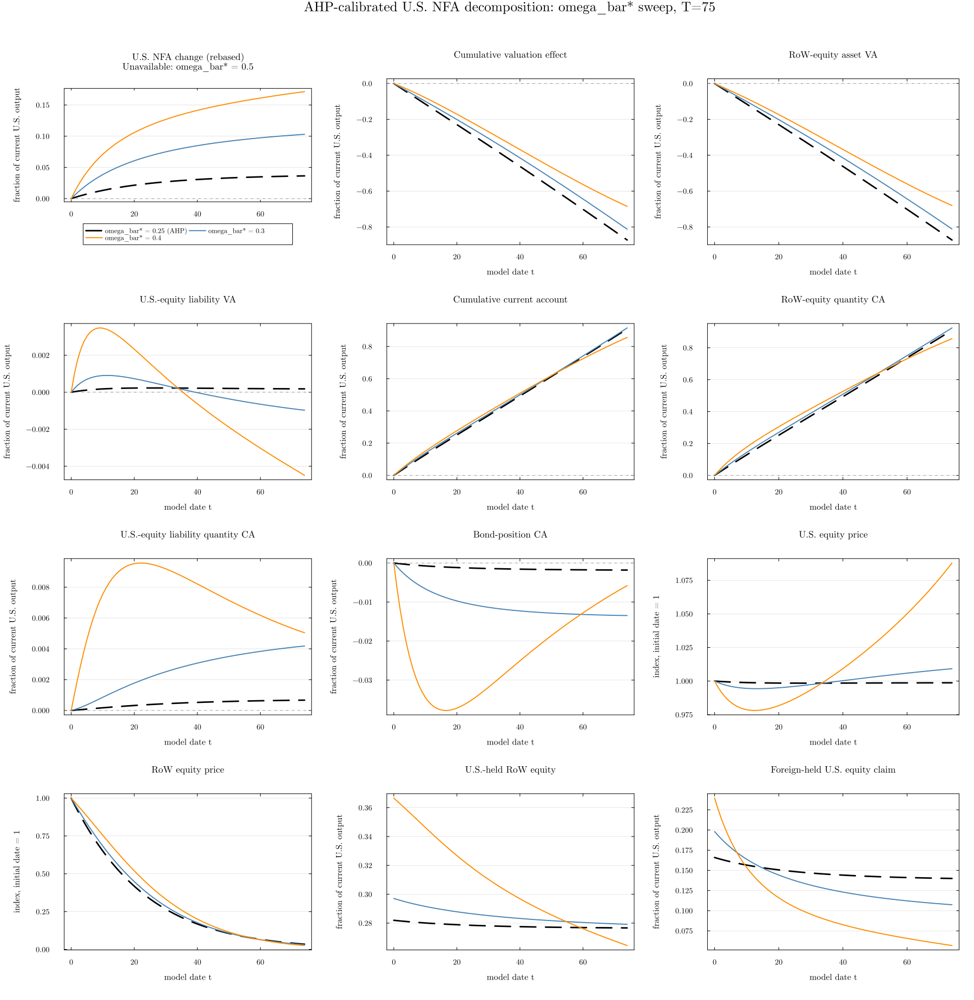

In [14]:
omega_star_nfa_sweep_figure

### Sweep over $\bar\omega$

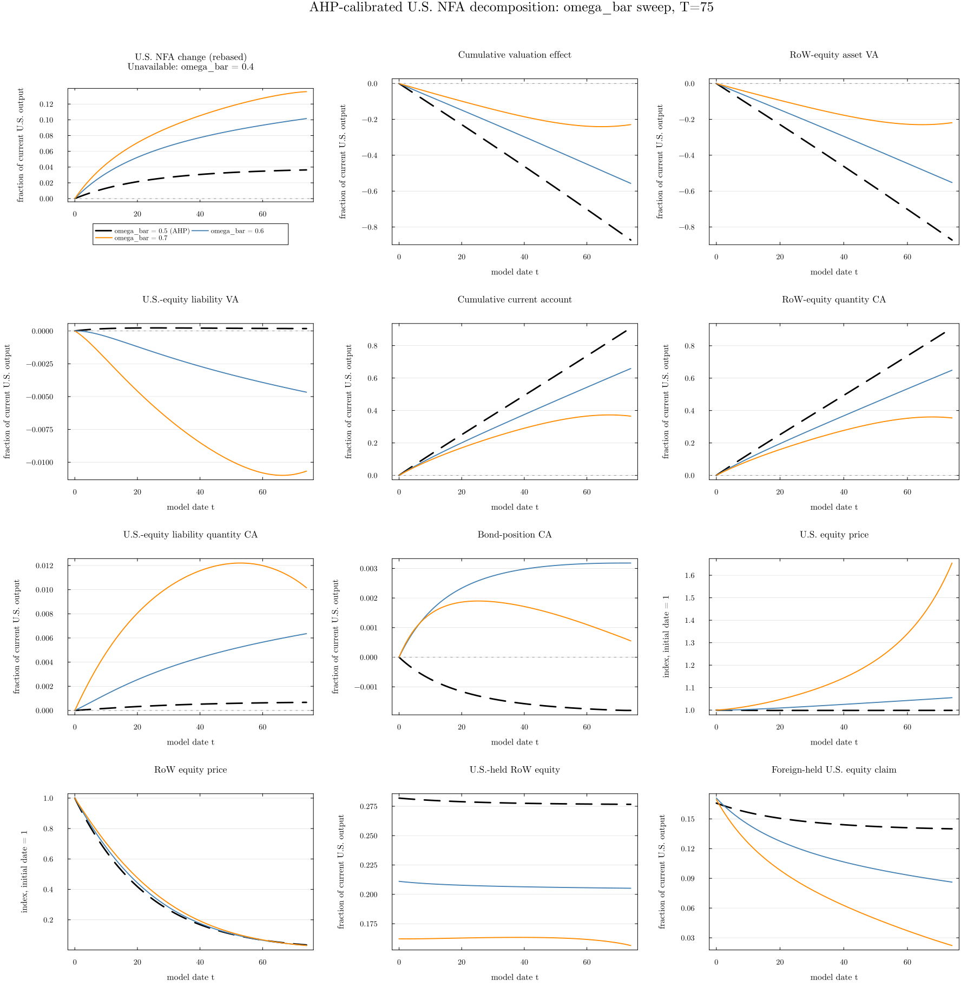

In [15]:
omega_nfa_sweep_figure

### Accounting and Feasibility Qualification

The first panel reports the change in U.S. NFA relative to its initial level, divided by current U.S. output. This is reconciled by cumulative valuation effects and cumulative current-account flows. Component panels use the same date-by-date valuation and quantity-flow accounting as the preceding zero-$\nu_b$ AHP comparison.

The one-percent equity-weight and $\theta^*$ interiority screens are reported separately from strict economic feasibility. A residual-safe path with portfolio weights and $\theta^*$ strictly inside $(0,1)$ is plotted even when it lies within one percentage point of a boundary; the case summary identifies such observations. Each figure annotates requested cases that are not plotted, distinguishing a numerical continuation frontier from a primitive-domain violation. All reported outcomes are generated anew under $\nu_b=\xi_W=0$.


In [16]:
all_nfa_sweep_cases = vcat(omega_star_nfa_sweep_cases, omega_nfa_sweep_cases)
println("Source-requested NFA horizon:      ", NB19_NFA_SOURCE_REQUESTED_T)
println("Resolved NFA sweep horizon:        ", NB19_NFA_SWEEP_T)
println("Requested NFA sweep cases:         ", length(all_nfa_sweep_cases))
println("Plotted feasible cases:           ",
        count(c.plot_feasible for c in all_nfa_sweep_cases),
        " / ", length(all_nfa_sweep_cases))
println("Passing one-percent regularity gates: ",
        count(c.result !== nothing && c.validity.valid
              for c in all_nfa_sweep_cases),
        " / ", length(all_nfa_sweep_cases))
println("Detailed diagnostics: ",
        joinpath(NB19_OUTDIR, "nfa_sweep_T75_case_summary.csv"))

Source-requested NFA horizon:      100
Resolved NFA sweep horizon:        75
Requested NFA sweep cases:         8
Plotted feasible cases:           6 / 8
Passing one-percent regularity gates: 6 / 8
Detailed diagnostics: /Users/jipengcheng/Library/Mobile Documents/com~apple~CloudDocs/【Research】/Two_country_HKT/Codes/Two_country_proudction_zero_nu_b/outputs_zero_nu_b/03_ahp_pattern_source_T110_resolved_T78/nfa_sweep_T75_case_summary.csv
